# Project Scope and Description

Training of neural networks for automated diagnosis of pigmented skin lesions is hampered by the small size and lack of diversity of available dataset of dermatoscopic images. This problem is tackled by releasing the HAM10000 ("Human Against Machine with 10000 training images") dataset. Dermatoscopic images from different populations were collected, acquired and stored by different modalities. The final dataset consists of 10015 dermatoscopic images.

Cases include a representative collection of all important diagnostic categories in the realm of pigmented lesions: Actinic keratoses and intraepithelial carcinoma / Bowen's disease (akiec), basal cell carcinoma (bcc), benign keratosis-like lesions (solar lentigines / seborrheic keratoses and lichen-planus like keratoses, bkl), dermatofibroma (df), melanoma (mel), melanocytic nevi (nv) and vascular lesions (angiomas, angiokeratomas, pyogenic granulomas and hemorrhage, vasc).

More than 50% of lesions are confirmed through histopathology (histo), the ground truth for the rest of the cases is either follow-up examination (followup), expert consensus (consensus), or confirmation by in-vivo confocal microscopy (confocal). The dataset includes lesions with multiple images, which can be tracked by the lesionid-column within the HAM10000_metadata file.

Credit: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000?datasetId=54339&sortBy=voteCount&select=HAM10000_images_part_1

For use of the dataset

In this project I willuse two different convolutional neural networks to detect the 7 different classes of skin lesions given. We will use a simpler base CNN and compare that to a more complex ResNet CNN.

In order to achieve this we will be roughly following the steps given below.

Step 1: Importing Essential Libraries

Step 2: Making Dictionary of images and labels

Step 3: Reading and Processing Data

Step 4: Data Cleaning

Step 5: Exploratory data analysis (EDA)

Step 6: Loading & Resizing of images

Step 7: Train Test Split

Step 8: Normalization

Step 9: Label Encoding

Step 10: Train validation split

Step 11: Model Building (CNN)

Step 12: Fitting the model

Step 13: Model Evaluation (Testing and validation accuracy, confusion matrix, analysis of misclassified instances

#### Import Libraries

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
import itertools

import keras
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split

#### Begin Preprocessing Dataframe

Making Dictionary of images and labels

In [2]:
# Reading the data
base_skin_dir = os.path.join('..', 'desktop/combine/')
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}

In [3]:
lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [4]:
# Reading Metadata csv file
skin_df = pd.read_csv('../desktop/HAM10000_metadata.csv')

In [5]:
# Adding extra columns and appending the required created columns in final dataframe
skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes

In [6]:
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,..\desktop/combine\HAM10000_images_part_2\ISIC...,Benign keratosis-like lesions,2


#### Data Cleaning and Exploration

In [7]:
skin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   lesion_id      10015 non-null  object 
 1   image_id       10015 non-null  object 
 2   dx             10015 non-null  object 
 3   dx_type        10015 non-null  object 
 4   age            9958 non-null   float64
 5   sex            10015 non-null  object 
 6   localization   10015 non-null  object 
 7   path           10015 non-null  object 
 8   cell_type      10015 non-null  object 
 9   cell_type_idx  10015 non-null  int8   
dtypes: float64(1), int8(1), object(8)
memory usage: 714.1+ KB


In [8]:
skin_df.isnull().sum()

lesion_id         0
image_id          0
dx                0
dx_type           0
age              57
sex               0
localization      0
path              0
cell_type         0
cell_type_idx     0
dtype: int64

Let's add the mean age in for the 57 null values listed

In [9]:
skin_df['age'].fillna((skin_df['age'].mean()), inplace=True)

In [10]:
skin_df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age              0
sex              0
localization     0
path             0
cell_type        0
cell_type_idx    0
dtype: int64

Let's look at our breakdown of features and see how balanced they are for each column. First and foremost let's take a look at the distribution of skin lesions.

In [11]:
def summary_table(df):
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    return summary

In [12]:
summary_table(skin_df)

,Name,dtypes,Missing,Uniques
0,lesion_id,object,0,7470
1,image_id,object,0,10015
2,dx,object,0,7
3,dx_type,object,0,4
4,age,float64,0,19
5,sex,object,0,3
6,localization,object,0,15
7,path,object,0,10015
8,cell_type,object,0,7
9,cell_type_idx,int8,0,7


<AxesSubplot:>

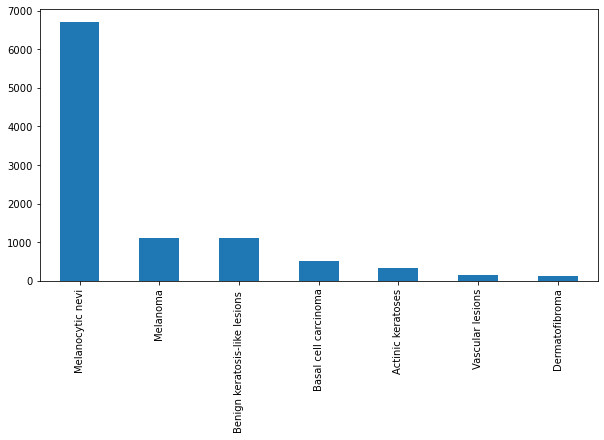

In [13]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
skin_df['cell_type'].value_counts().plot(kind='bar', ax=ax1)

Its seems from the above plot that in this dataset cell type Melanecytic nevi has very large number of instances in comparison to other lesions. Let's visualize a few examples from each.

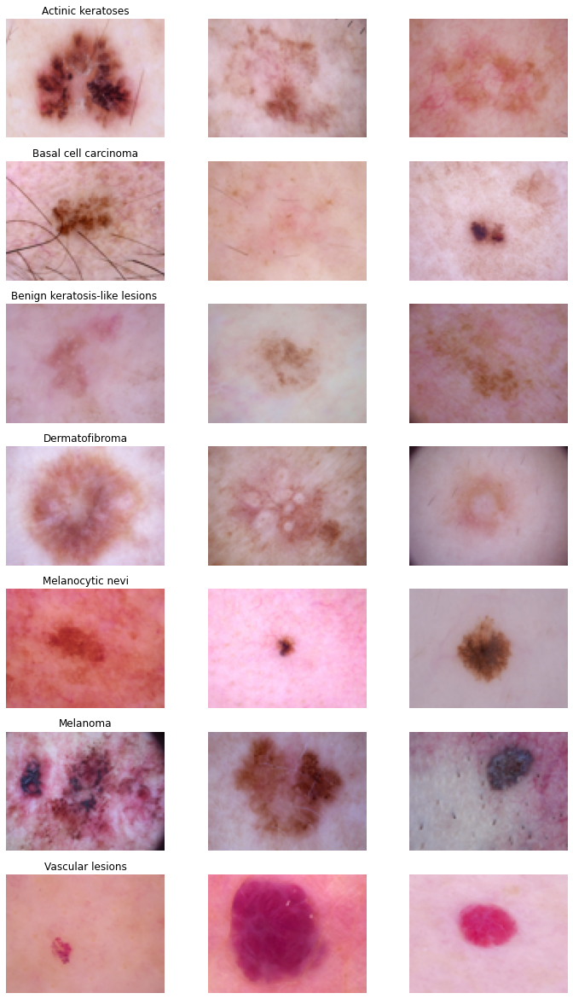

In [14]:
img = skin_df.sample(n=500,replace=False, random_state=1)
img['image'] = img['path'].map(lambda x: np.asarray(Image.open(x).resize((100,75))))
#Image Sampling
n_samples = 3

fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))

for n_axs, (type_name, type_rows) in zip(m_axs,img.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

Plotting of Technical Validation field (ground truth) which is dx_type to see the distribution of its 4 categories which are listed below :
1. Histopathology(Histo): Histopathologic diagnoses of excised lesions have been performed by specialized dermatopathologists.
2. Confocal: Reflectance confocal microscopy is an in-vivo imaging technique with a resolution at near-cellular level , and some facial benign with a grey-world assumption of all training-set images in Lab-color space before and after manual histogram changes.
3. Follow-up: If nevi monitored by digital dermatoscopy did not show any changes during 3 follow-up visits or 1.5 years biologists accepted this as evidence of biologic benignity. Only nevi, but no other benign diagnoses were labeled with this type of ground-truth because dermatologists usually do not monitor dermatofibromas, seborrheic keratoses, or vascular lesions.
4. Consensus: For typical benign cases without histopathology or followup biologists provide an expert-consensus rating of authors PT and HK. They applied the consensus label only if both authors independently gave the same unequivocal benign diagnosis. Lesions with this type of groundtruth were usually photographed for educational reasons and did not need further follow-up or biopsy for confirmation.

Credit: https://www.kaggle.com/code/sid321axn/step-wise-approach-cnn-model-77-0344-accuracy

<AxesSubplot:>

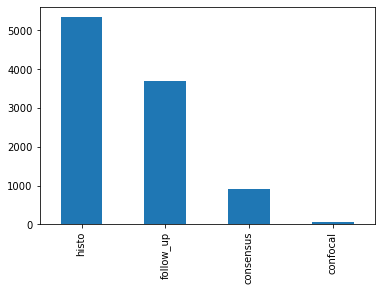

In [15]:
skin_df['dx_type'].value_counts().plot(kind='bar')

Plotting of where lesion was found.

<AxesSubplot:>

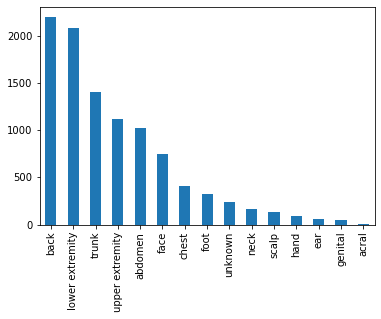

In [16]:
skin_df['localization'].value_counts().plot(kind='bar')

Age distribution plotting

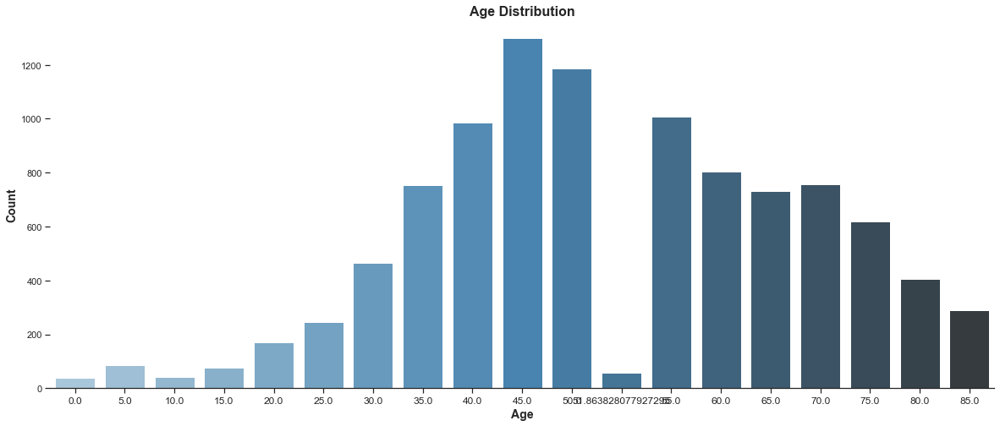

In [17]:
skin_df['age'].fillna((skin_df['age'].mode()), inplace=True)

plt.figure(figsize=(20,8))
sns.set(style="ticks", font_scale = 1)
ax = sns.countplot(data = skin_df,x='age',palette="Blues_d")
sns.despine(top=True, right=True, left=True, bottom=False)
plt.xticks(rotation=0,fontsize = 12)
ax.set_xlabel('Age',fontsize = 14,weight = 'bold')
ax.set_ylabel('Count',fontsize = 14,weight = 'bold')
plt.title('Age Distribution', fontsize = 16,weight = 'bold');

It appears there are the largest proportion of cases from ages 35-55.

Plotting gender split

Text(0.5, 1.0, 'Gender of Patient')

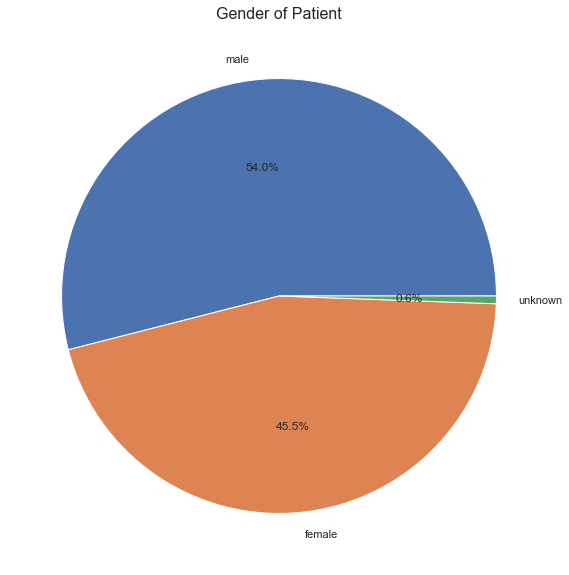

In [18]:
bar, ax = plt.subplots(figsize = (10,10))
plt.pie(skin_df['sex'].value_counts(), labels = skin_df['sex'].value_counts().index, autopct="%.1f%%")
plt.title('Gender of Patient', size=16)

## Malignancies

Although all cases of skin lesions can be serious, I want to take a look at the two types of cancer represented in the dataset Melanoma and Basal cell carcinoma) . These have the potential to be life threatening, so they deserve more attention. 

In [19]:
skin_mel = skin_df.loc[:,['age','sex','localization','cell_type']]
skin_mel = skin_mel[skin_mel['cell_type'] == 'Melanoma']

<AxesSubplot:>

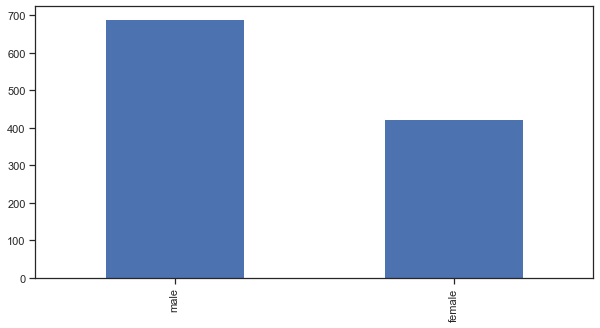

In [20]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
skin_mel['sex'].value_counts().plot(kind='bar', ax=ax1)

Regarding gender, in the previous section, we saw a similar distribution across the main two genders. However, considering only Melanoma we can see from the above plot that more than 60% of the cases reported are Male

In [21]:
skin_car = skin_df.loc[:,['age','sex','localization','cell_type']]
skin_car = skin_car[skin_car['cell_type'] == 'Basal cell carcinoma']

In [22]:
skin_car

,age,sex,localization,cell_type
2462,50.0,male,back,Basal cell carcinoma
2463,80.0,female,face,Basal cell carcinoma
2464,50.0,male,trunk,Basal cell carcinoma
2465,50.0,male,trunk,Basal cell carcinoma
2466,50.0,male,back,Basal cell carcinoma
...,...,...,...,...
2971,45.0,male,chest,Basal cell carcinoma
2972,70.0,male,back,Basal cell carcinoma
2973,70.0,male,back,Basal cell carcinoma
2974,40.0,female,abdomen,Basal cell carcinoma


<AxesSubplot:>

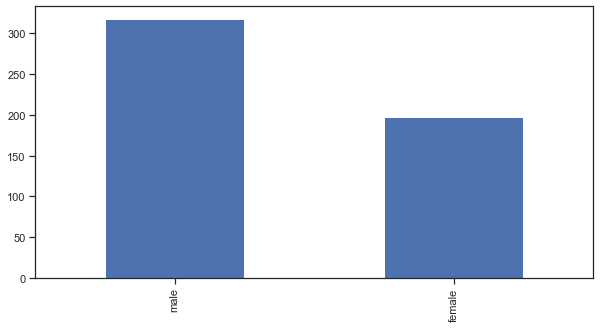

In [23]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
skin_car['sex'].value_counts().plot(kind='bar', ax=ax1)

The same appears to be true in terms of gender distribution for basal cell carcinoma.

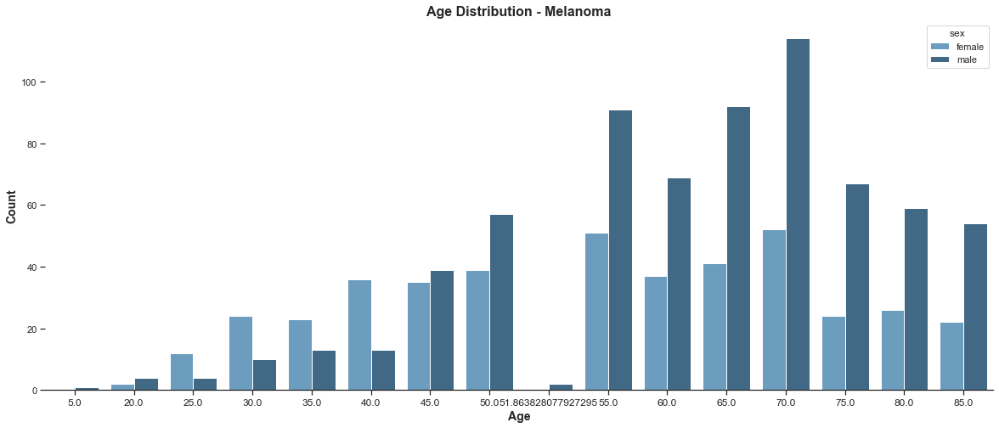

In [24]:
plt.figure(figsize=(20,8))
sns.set(style="ticks", font_scale = 1)
ax = sns.countplot(data = skin_mel,x='age',palette="Blues_d", hue = 'sex')
sns.despine(top=True, right=True, left=True, bottom=False)
plt.xticks(rotation=0,fontsize = 12)
ax.set_xlabel('Age',fontsize = 14,weight = 'bold')
ax.set_ylabel('Count',fontsize = 14,weight = 'bold')
plt.title('Age Distribution - Melanoma', fontsize = 16,weight = 'bold');

When we look at the age distribution for Melanoma when compared to the whole dataset there are some major differences. Primarily we can see that they are quite present at age 55 and age 70. Weirdly enough the younger you are the more likely you are to be a female. That changes as the age range goes up though.

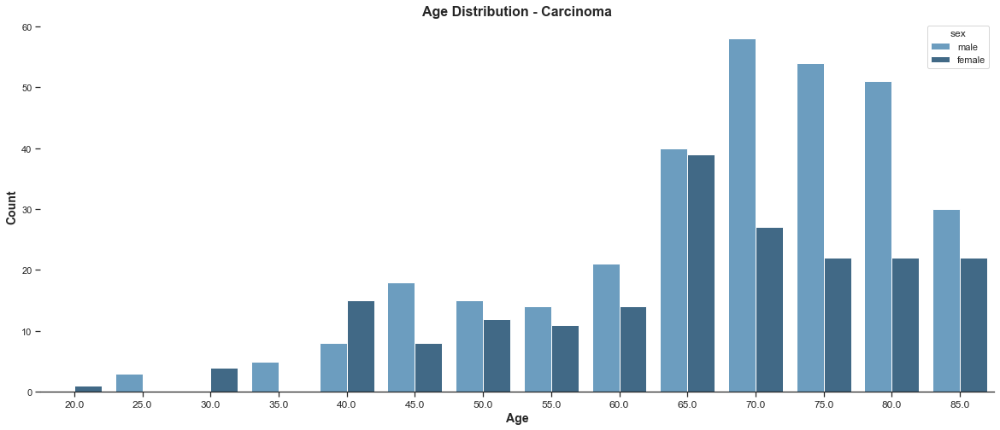

In [25]:
plt.figure(figsize=(20,8))
sns.set(style="ticks", font_scale = 1)
ax = sns.countplot(data = skin_car,x='age',palette="Blues_d", hue = 'sex')
sns.despine(top=True, right=True, left=True, bottom=False)
plt.xticks(rotation=0,fontsize = 12)
ax.set_xlabel('Age',fontsize = 14,weight = 'bold')
ax.set_ylabel('Count',fontsize = 14,weight = 'bold')
plt.title('Age Distribution - Carcinoma', fontsize = 16,weight = 'bold');

For basal cell carcinoma, males tend to have a higher count for every age range other than 40. Like the melanoma age distribution this one certainly tends to skew older, primarily into the 70s and 80s.

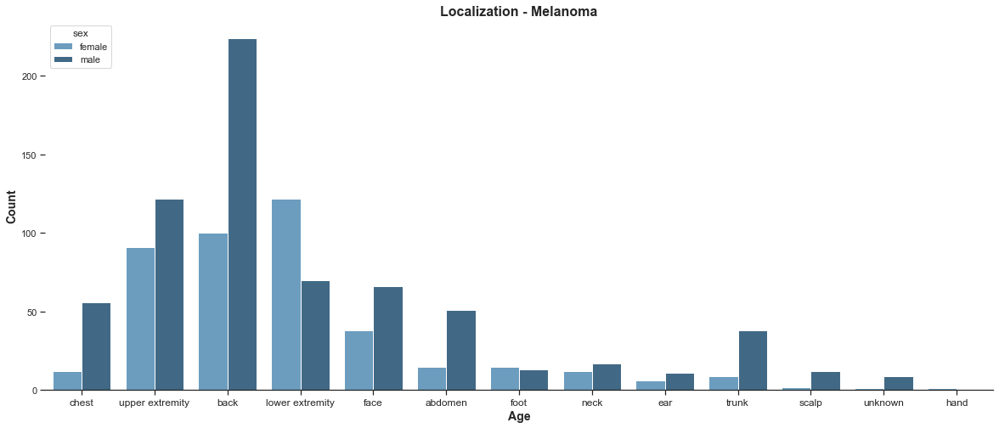

In [26]:
plt.figure(figsize=(20,8))
sns.set(style="ticks", font_scale = 1)
ax = sns.countplot(data = skin_mel,x='localization',palette="Blues_d", hue = 'sex')
sns.despine(top=True, right=True, left=True, bottom=False)
plt.xticks(rotation=0,fontsize = 12)
ax.set_xlabel('Age',fontsize = 14,weight = 'bold')
ax.set_ylabel('Count',fontsize = 14,weight = 'bold')
plt.title('Localization - Melanoma', fontsize = 16,weight = 'bold');

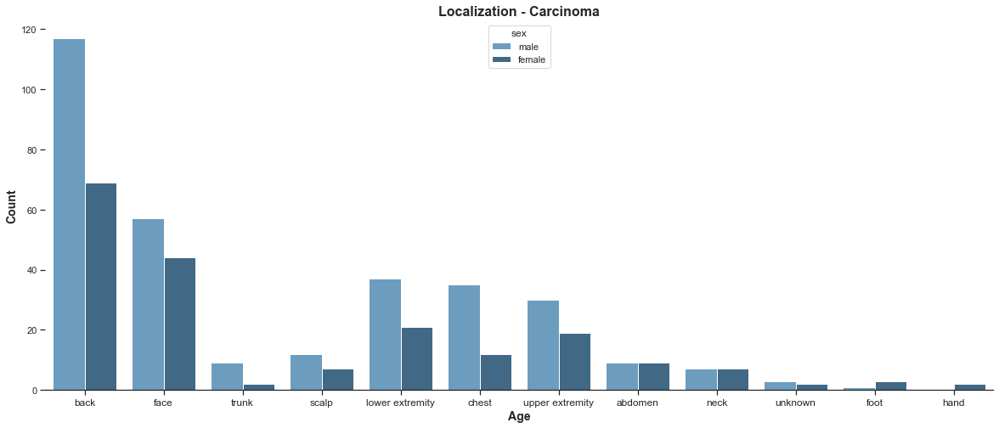

In [27]:
plt.figure(figsize=(20,8))
sns.set(style="ticks", font_scale = 1)
ax = sns.countplot(data = skin_car,x='localization',palette="Blues_d", hue = 'sex')
sns.despine(top=True, right=True, left=True, bottom=False)
plt.xticks(rotation=0,fontsize = 12)
ax.set_xlabel('Age',fontsize = 14,weight = 'bold')
ax.set_ylabel('Count',fontsize = 14,weight = 'bold')
plt.title('Localization - Carcinoma', fontsize = 16,weight = 'bold');

## Image Preprocessing and EDA

In [28]:
skin_df

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,..\desktop/combine\HAM10000_images_part_2\ISIC...,Benign keratosis-like lesions,2
...,...,...,...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen,..\desktop/combine\HAM10000_images_part_2\ISIC...,Actinic keratoses,0
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen,..\desktop/combine\HAM10000_images_part_2\ISIC...,Actinic keratoses,0
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen,..\desktop/combine\HAM10000_images_part_2\ISIC...,Actinic keratoses,0
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face,..\desktop/combine\HAM10000_images_part_2\ISIC...,Actinic keratoses,0


In [14]:
from skimage.io import imread
skin_df['image'] = skin_df['path'].map(imread)

In [30]:
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx,image
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[188, 147, 191], [186, 148, 189], [187, 150,..."
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[25, 15, 23], [25, 14, 22], [25, 14, 22], [2..."
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[186, 128, 140], [188, 128, 136], [183, 126,..."
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[24, 9, 16], [22, 11, 15], [23, 11, 15], [26..."
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,..\desktop/combine\HAM10000_images_part_2\ISIC...,Benign keratosis-like lesions,2,"[[[122, 80, 102], [124, 82, 104], [127, 83, 10..."


In [15]:
# see the image size distribution
skin_df['image'].map(lambda x: x.shape).value_counts()

(450, 600, 3)    10015
Name: image, dtype: int64

It may be useful to get the average color information for the images. Here we will get the mean and normalize to see what our RGB distribution looks like. This way we can analyze the different lesions and which colors they tend to skew towards.

In [32]:
rgb_info_df = skin_df.apply(lambda x: pd.Series({'{}_mean'.format(k): v for k, v in 
                                  zip(['Red', 'Green', 'Blue'], 
                                      np.mean(x['image'], (0, 1)))}),1)
gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1)
for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col]/gray_col_vec
rgb_info_df['Gray_mean'] = gray_col_vec
rgb_info_df.sample(3)

,Red_mean,Green_mean,Blue_mean,Gray_mean
9725,1.208599,0.935608,0.855793,184.139942
6059,1.431599,0.805693,0.762709,152.307154
4540,1.429941,0.675902,0.894157,122.299928


In [33]:
for c_col in rgb_info_df.columns:
    skin_df[c_col] = rgb_info_df[c_col].values # we cant afford a copy

In [34]:
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx,image,Red_mean,Green_mean,Blue_mean,Gray_mean
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[188, 147, 191], [186, 148, 189], [187, 150,...",1.132182,0.882501,0.985317,184.366342
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[25, 15, 23], [25, 14, 22], [25, 14, 22], [2...",1.114033,0.884626,1.001342,176.958935
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[186, 128, 140], [188, 128, 136], [183, 126,...",1.179274,0.861728,0.958999,181.513237
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,Benign keratosis-like lesions,2,"[[[24, 9, 16], [22, 11, 15], [23, 11, 15], [26...",1.184934,0.863432,0.951634,165.164157
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,..\desktop/combine\HAM10000_images_part_2\ISIC...,Benign keratosis-like lesions,2,"[[[122, 80, 102], [124, 82, 104], [127, 83, 10...",1.124242,0.892027,0.983731,188.312958


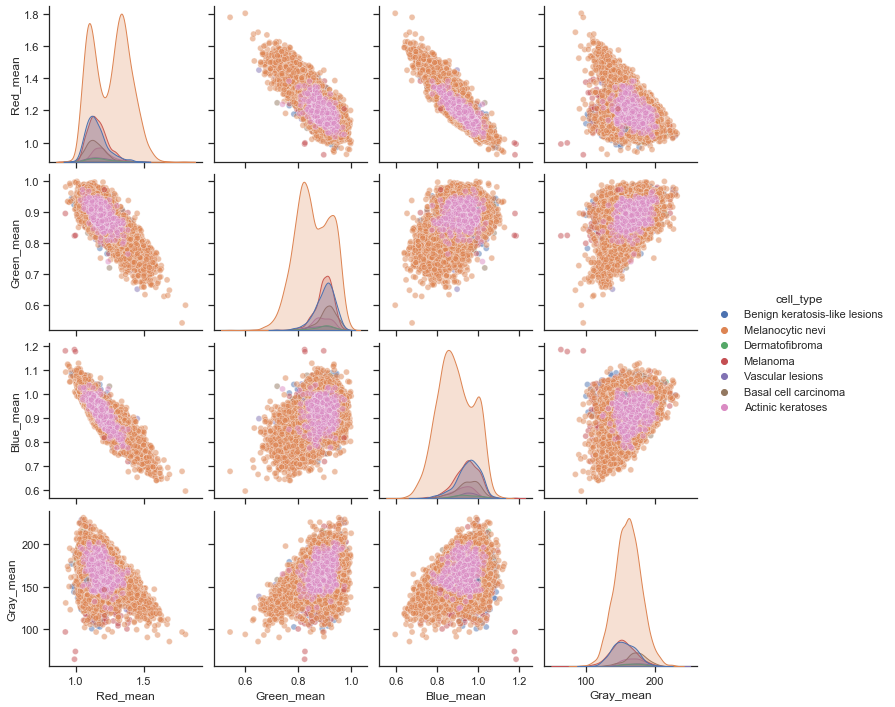

In [35]:
sns.pairplot(skin_df[['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean', 'cell_type']], 
             hue='cell_type', plot_kws = {'alpha': 0.5})

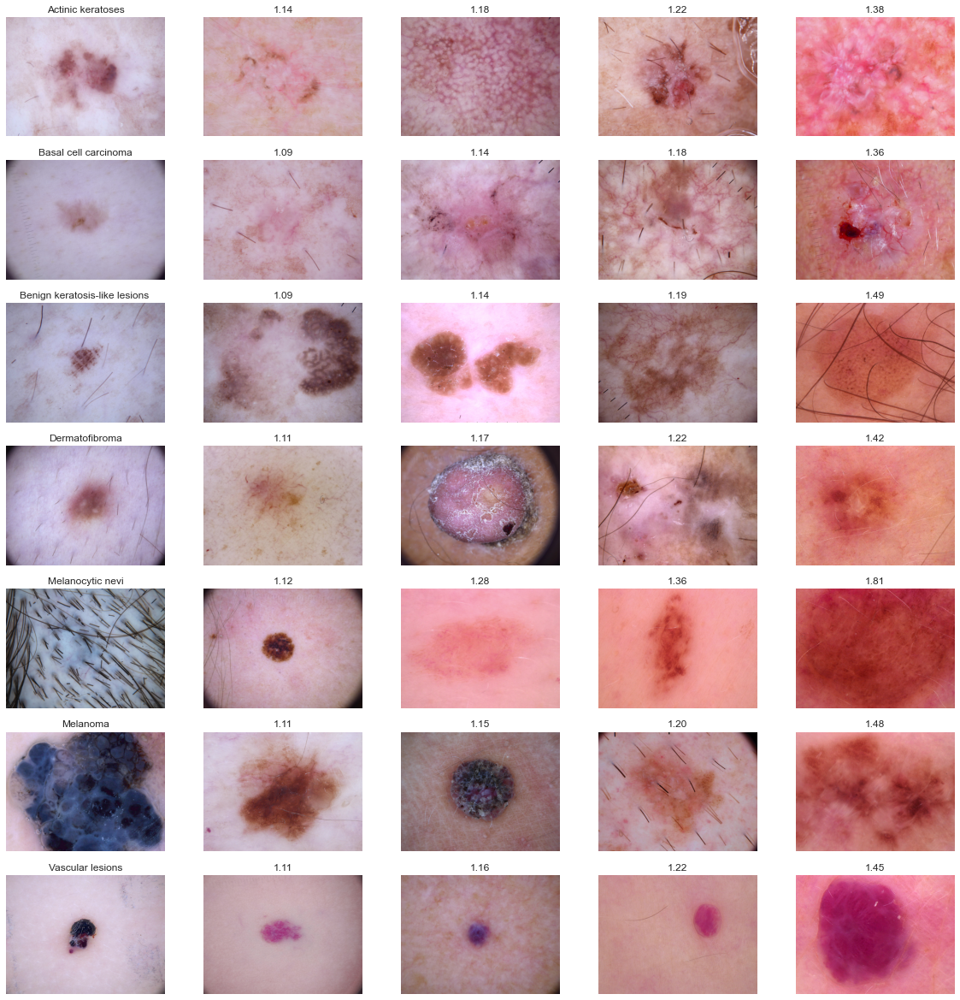

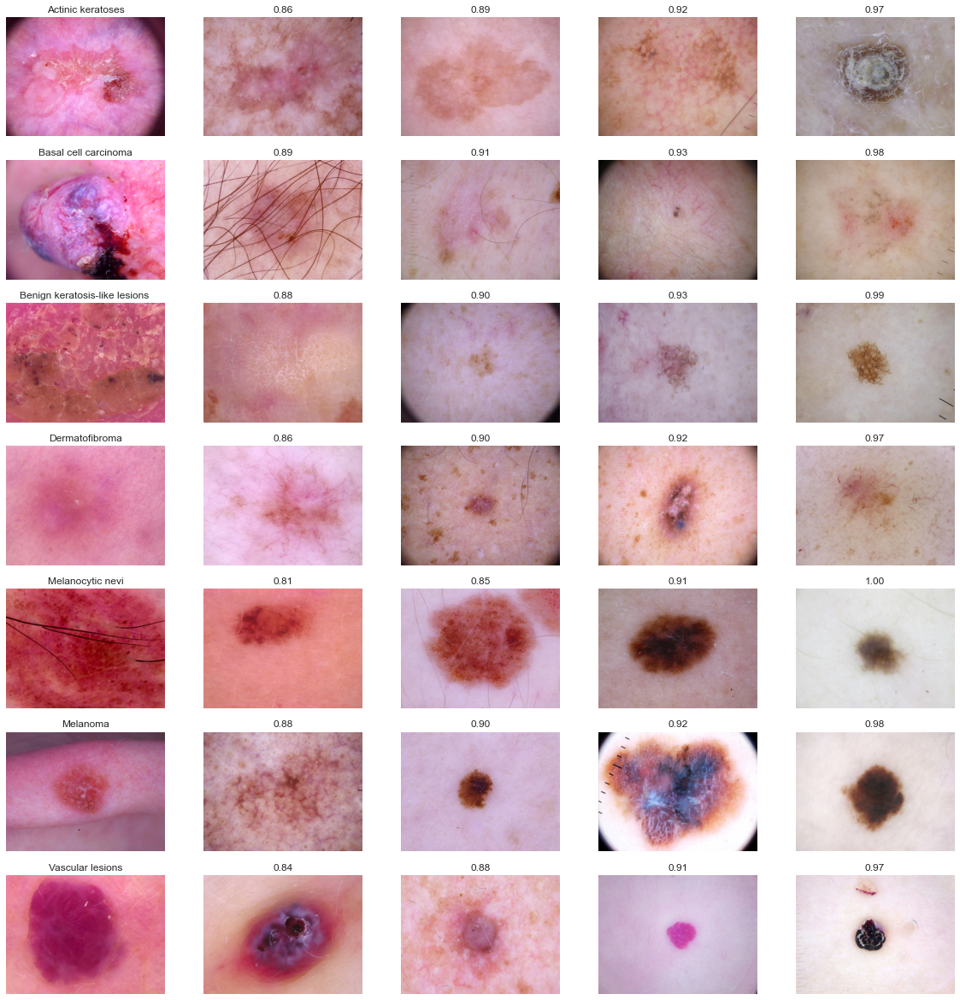

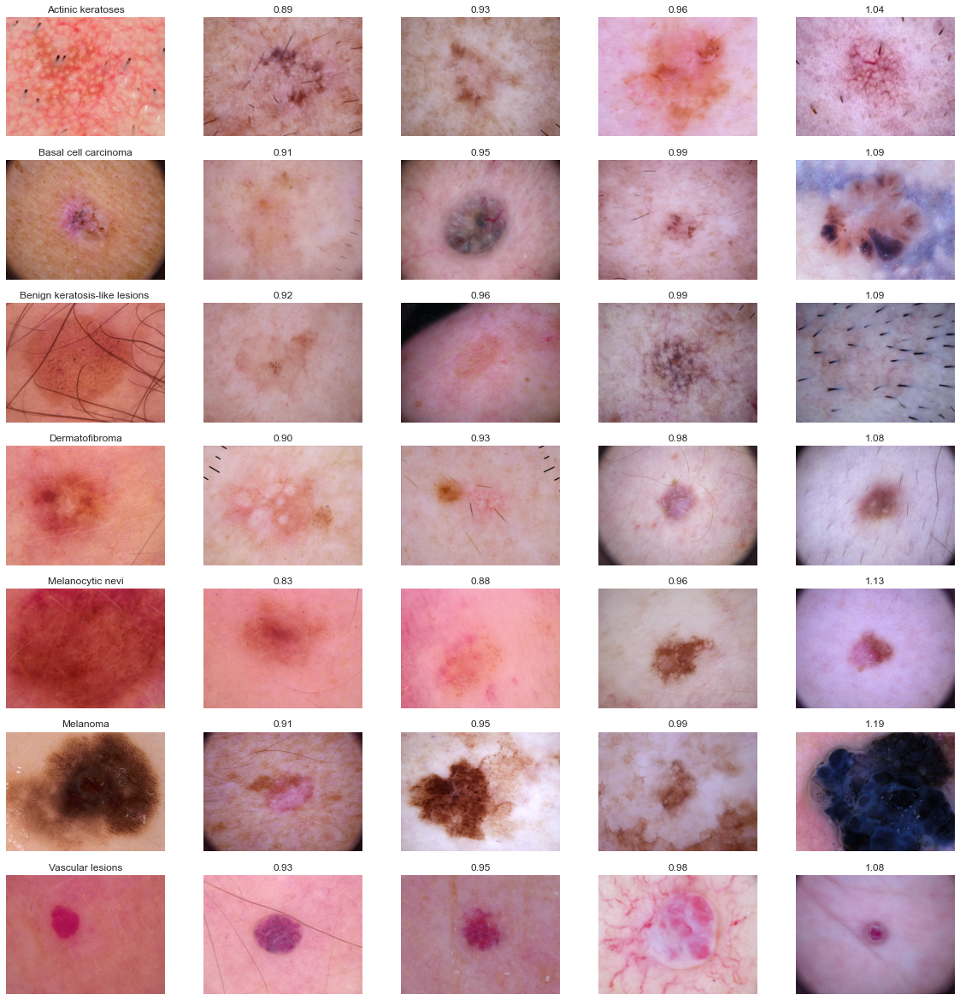

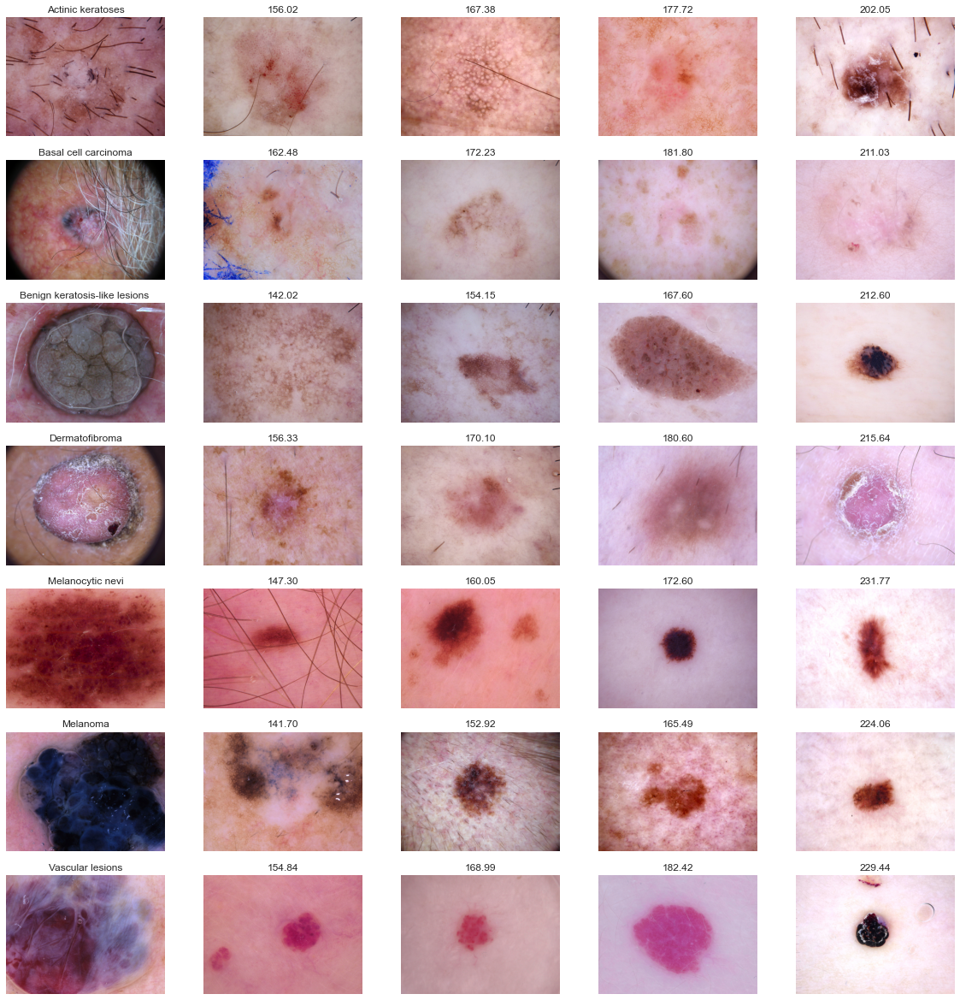

In [36]:
n_samples = 5
for sample_col in ['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean']:
    fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
    def take_n_space(in_rows, val_col, n):
        s_rows = in_rows.sort_values([val_col])
        s_idx = np.linspace(0, s_rows.shape[0]-1, n, dtype=int)
        return s_rows.iloc[s_idx]
    for n_axs, (type_name, type_rows) in zip(m_axs, 
                                             skin_df.sort_values(['cell_type']).groupby('cell_type')):

        for c_ax, (_, c_row) in zip(n_axs, 
                                    take_n_space(type_rows, 
                                                 sample_col,
                                                 n_samples).iterrows()):
            c_ax.imshow(c_row['image'])
            c_ax.axis('off')
            c_ax.set_title('{:2.2f}'.format(c_row[sample_col]))
        n_axs[0].set_title(type_name)
    fig.savefig('{}_samples.png'.format(sample_col), dpi=300)

In this step images will be loaded into the column named image from the image path from the image folder. We also resize the images as the original dimension of images are 450 x 600 x3 which TensorFlow can't handle, so that's why we resize it into 100 x 75.

In [16]:
skin_df['image'] = skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((100,75))))

In [17]:
# Checking the image size distribution
skin_df['image'].map(lambda x: x.shape).value_counts()

(75, 100, 3)    10015
Name: image, dtype: int64

In [19]:
# Creating Target
y = np.array(skin_df['cell_type_idx'])
#x = skin_df.drop(columns = ['cell_type_idx', 'cell_type', 'dx', 'Red_mean','Green_mean','Blue_mean','Gray_mean'])
x = skin_df.drop(columns = ['cell_type_idx', 'cell_type', 'dx'])

In [20]:
x

,lesion_id,image_id,dx_type,age,sex,localization,path,image
0,HAM_0000118,ISIC_0027419,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,"[[[190, 153, 194], [192, 154, 196], [191, 153,..."
1,HAM_0000118,ISIC_0025030,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,"[[[23, 13, 22], [24, 14, 24], [25, 14, 28], [3..."
2,HAM_0002730,ISIC_0026769,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,"[[[185, 127, 137], [189, 133, 147], [194, 136,..."
3,HAM_0002730,ISIC_0025661,histo,80.0,male,scalp,..\desktop/combine\HAM10000_images_part_1\ISIC...,"[[[24, 11, 17], [26, 13, 22], [38, 21, 32], [5..."
4,HAM_0001466,ISIC_0031633,histo,75.0,male,ear,..\desktop/combine\HAM10000_images_part_2\ISIC...,"[[[134, 90, 113], [147, 102, 125], [159, 115, ..."
...,...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,histo,40.0,male,abdomen,..\desktop/combine\HAM10000_images_part_2\ISIC...,"[[[155, 137, 148], [154, 136, 147], [151, 134,..."
10011,HAM_0002867,ISIC_0033550,histo,40.0,male,abdomen,..\desktop/combine\HAM10000_images_part_2\ISIC...,"[[[5, 6, 4], [6, 7, 4], [7, 8, 6], [7, 7, 5], ..."
10012,HAM_0002867,ISIC_0033536,histo,40.0,male,abdomen,..\desktop/combine\HAM10000_images_part_2\ISIC...,"[[[112, 102, 105], [127, 116, 117], [141, 127,..."
10013,HAM_0000239,ISIC_0032854,histo,80.0,male,face,..\desktop/combine\HAM10000_images_part_2\ISIC...,"[[[159, 122, 146], [159, 123, 141], [154, 112,..."


Let's split our data now into a train, test and validation set.

In [21]:
x_train_o, x_test_o, y_train_o, y_test_o = train_test_split(x, y, test_size=0.20,random_state=1234)

We can also normalize our data, as this greatly helps performance on neural networks.

In [22]:
x_train = np.asarray(x_train_o['image'].tolist())
x_test = np.asarray(x_test_o['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

In [23]:
# Perform one-hot encoding on the labels
y_train = to_categorical(y_train_o, num_classes = 7)
y_test = to_categorical(y_test_o, num_classes = 7)

In [24]:
x_train, x_validate, y_train, y_validate = train_test_split(x_train, y_train, test_size = 0.1, random_state = 2)

In [25]:
# Reshape image in 3 dimensions (height = 75px, width = 100px , canal = 3)
x_train = x_train.reshape(x_train.shape[0], *(75, 100, 3))
x_test = x_test.reshape(x_test.shape[0], *(75, 100, 3))
x_validate = x_validate.reshape(x_validate.shape[0], *(75, 100, 3))

In [26]:
x_train

array([[[[ 1.10034088, -1.24603699, -0.75092974],
         [ 1.14339368, -1.15993138, -0.70787693],
         [ 1.14339368, -1.11687858, -0.68635053],
         ...,
         [ 1.46628972, -0.14819047,  0.08859996],
         [ 1.40171051, -0.23429608,  0.00249435],
         [ 1.35865771, -0.23429608, -0.04055846]],

        [[ 1.07881447, -1.22451059, -0.77245614],
         [ 1.03576167, -1.22451059, -0.81550894],
         [ 1.05728807, -1.18145779, -0.81550894],
         ...,
         [ 1.40171051, -0.34192809, -0.08361126],
         [ 1.35865771, -0.34192809, -0.10513766],
         [ 1.3156049 , -0.27734888, -0.04055846]],

        [[ 1.07881447, -1.18145779, -0.70787693],
         [ 1.03576167, -1.22451059, -0.77245614],
         [ 1.12186728, -1.11687858, -0.70787693],
         ...,
         [ 1.35865771, -0.49261291, -0.14819047],
         [ 1.3371313 , -0.32040169, -0.08361126],
         [ 1.2725521 , -0.36345449, -0.12666407]],

        ...,

        [[ 1.3156049 , -0.29887529, -0

In [27]:
x_validate

array([[[[ 1.48781612, -0.32040169,  0.02402075],
         [ 1.48781612, -0.25582248,  0.04554715],
         [ 1.53086893, -0.25582248,  0.04554715],
         ...,
         [ 1.81071216,  0.06707356,  0.54065441],
         [ 1.74613295, -0.01903205,  0.4330224 ],
         [ 1.72460655, -0.04055846,  0.411496  ]],

        [[ 1.48781612, -0.19124327,  0.15317917],
         [ 1.53086893, -0.12666407,  0.21775837],
         [ 1.57392173, -0.12666407,  0.19623197],
         ...,
         [ 1.83223856,  0.04554715,  0.51912801],
         [ 1.76765935,  0.02402075,  0.4545488 ],
         [ 1.74613295,  0.02402075,  0.4330224 ]],

        [[ 1.57392173, -0.08361126,  0.26081118],
         [ 1.63850094,  0.00249435,  0.34691679],
         [ 1.63850094,  0.00249435,  0.38996959],
         ...,
         [ 1.76765935,  0.00249435,  0.411496  ],
         [ 1.74613295,  0.00249435,  0.411496  ],
         [ 1.76765935,  0.06707356,  0.4760752 ]],

        ...,

        [[ 1.3371313 , -0.14819047, -0

## Model Building

This is our first baseline CNN that we will compare against our ResNet. A potential flaw with comparing them is we have differences in a few of the hyperparameters. 

In this model we have three dropout layers of 0.25, 0.4 and 0.5. Dropout layers are used primarily as a function for preventing overfitting. In simple terms a dropout layer is a mask that nullifies the contribution of some neurons towards the next layer and leaves unmodified all others.

We have 4 total convolutional (Conv2D) layers. They are set to 32 filters for the two firsts conv2D layers and 64 filters for the two last ones. Each filter transforms a part of the image (defined by the kernel size) using the kernel filter.

The basic architecture is as follows In -> [[Conv2D->relu] * 2 -> MaxPool2D -> Dropout]*2 -> Flatten -> Dense -> Dropout -> Out

Apart from the convolutional layers we have max pooling layers. Max pooling, is a pooling operation that calculates the maximum, or largest, value in each patch of each feature map. The results are down sampled or pooled feature maps that highlight the most present feature in the patch, not the average presence of the feature in the case of average pooling. This has been found to work better in practice than average pooling for computer vision tasks like image classification.

Combining convolutional and pooling layers, CNN are able to combine local features and learn more global features of the image.

For our first activation function we are using 'relu'. Relu is the rectifier (activation function max(0,x). The rectifier activation function is used to add non linearity to the network.

The Flatten layer is use to convert the final feature maps into a one single 1D vector. This flattening step is needed so that you can make use of fully connected layers after some convolutional/maxpool layers. It combines all the found local features of the previous convolutional layers.

Lastly we have a dense layer and output using a softmax activation function. Softmax assigns decimal probabilities to each class in a multi-class problem. Those decimal probabilities must add up to 1.0. This additional constraint helps training converge more quickly than it otherwise would.

In [48]:
input_shape = (75, 100, 3)
num_classes = 7

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',padding = 'Same',input_shape=input_shape))
model.add(Conv2D(32,kernel_size=(3, 3), activation='relu',padding = 'Same',))
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.40))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 75, 100, 32)       896       
                                                                 
 conv2d_1 (Conv2D)           (None, 75, 100, 32)       9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 37, 50, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 37, 50, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 37, 50, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 37, 50, 64)        36928     
                                                        

In [49]:
#1. Function to plot model's validation loss and validation accuracy
def plot_model_history(model_history):
    fig, axs = plt.subplots(1,2,figsize=(15,5))
    # summarize history for accuracy
    axs[0].plot(range(1,len(model_history.history['acc'])+1),model_history.history['acc'])
    axs[0].plot(range(1,len(model_history.history['val_acc'])+1),model_history.history['val_acc'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1,len(model_history.history['acc'])+1),len(model_history.history['acc'])/10)
    axs[0].legend(['train', 'val'], loc='best')
    # summarize history for loss
    axs[1].plot(range(1,len(model_history.history['loss'])+1),model_history.history['loss'])
    axs[1].plot(range(1,len(model_history.history['val_loss'])+1),model_history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1,len(model_history.history['loss'])+1),len(model_history.history['loss'])/10)
    axs[1].legend(['train', 'val'], loc='best')
    plt.show()

In [28]:
import keras
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split

We will be using an 'adam' optimizer. Adam is an optimization algorithm that can be used instead of the classical stochastic gradient descent procedure to update network weights iterative based in training data. Adam is a combination of AdaGrad and RMSProp, which are also extensions of stochastic gradient descent. Adam realizes the benefits of both AdaGrad and RMSProp.

Instead of adapting the parameter learning rates based on the average first moment (the mean) as in RMSProp, Adam also makes use of the average of the second moments of the gradients (the uncentered variance).

Specifically, the algorithm calculates an exponential moving average of the gradient and the squared gradient, and the parameters beta1 and beta2 control the decay rates of these moving averages.


Credit: https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/

In [51]:
# Define the optimizer
optimizer = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

In [52]:
# Compile the model
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

In [53]:
y_train

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]], dtype=float32)

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

In [55]:
# Set a learning rate annealer
earlystopping = EarlyStopping(monitor='val_loss', 
                              mode='min', 
                              verbose=1, 
                              patience=15
                             )
checkpointer = ModelCheckpoint(filepath="clf-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )
callbacks = [checkpointer, earlystopping, reduce_lr]

Keras ImageDataGenerator class provides a quick and easy way to augment your images. It provides a host of different augmentation techniques like standardization, rotation, shifts, flips and brightness change.

However, the main benefit of using the Keras ImageDataGenerator class is that it is designed to provide real-time data augmentation. Meaning it is generating augmented images on the fly while your model is still in the training stage.

ImageDataGenerator class ensures that the model receives new variations of the images at each epoch. But it only returns the transformed images and does not add it to the original corpus of images. If it was, in fact, the case, then the model would be seeing the original images multiple times which would definitely overfit our model.

Source: https://www.analyticsvidhya.com/blog/2020/08/image-augmentation-on-the-fly-using-keras-imagedatagenerator/#:~:text=Random%20Rotations,value%20in%20the%20rotation_range%20argument.

In [29]:
# With data augmentation to prevent overfitting 
datagen = ImageDataGenerator(rescale=1./255.)
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images

datagen.fit(x_train)

In [57]:
# Fit the model
epochs = 50 
batch_size = 10
h = model.fit(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_validate,y_validate),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size,
                              callbacks=[checkpointer, earlystopping, reduce_lr])

Epoch 1/50
721/721 [==============================] - ETA: 0s - loss: 1.0214 - accuracy: 0.6652
Epoch 00001: val_loss improved from inf to 1.09621, saving model to clf-resnet-weights.hdf5
721/721 [==============================] - 87s 120ms/step - loss: 1.0214 - accuracy: 0.6652 - val_loss: 1.0962 - val_accuracy: 0.6808 - lr: 0.0010
Epoch 2/50
721/721 [==============================] - ETA: 0s - loss: 0.9254 - accuracy: 0.6713
Epoch 00002: val_loss improved from 1.09621 to 0.84035, saving model to clf-resnet-weights.hdf5
721/721 [==============================] - 81s 112ms/step - loss: 0.9254 - accuracy: 0.6713 - val_loss: 0.8404 - val_accuracy: 0.6833 - lr: 0.0010
Epoch 3/50
721/721 [==============================] - ETA: 0s - loss: 0.8996 - accuracy: 0.6774
Epoch 00003: val_loss improved from 0.84035 to 0.82636, saving model to clf-resnet-weights.hdf5
721/721 [==============================] - 80s 110ms/step - loss: 0.8996 - accuracy: 0.6774 - val_loss: 0.8264 - val_accuracy: 0.6958 

Epoch 28/50
721/721 [==============================] - ETA: 0s - loss: 0.6595 - accuracy: 0.7545
Epoch 00028: val_loss did not improve from 0.66316
721/721 [==============================] - 81s 112ms/step - loss: 0.6595 - accuracy: 0.7545 - val_loss: 0.6826 - val_accuracy: 0.7718 - lr: 0.0010
Epoch 29/50
721/721 [==============================] - ETA: 0s - loss: 0.6714 - accuracy: 0.7509
Epoch 00029: val_loss did not improve from 0.66316
721/721 [==============================] - 81s 112ms/step - loss: 0.6714 - accuracy: 0.7509 - val_loss: 0.7272 - val_accuracy: 0.7357 - lr: 0.0010
Epoch 30/50
721/721 [==============================] - ETA: 0s - loss: 0.6750 - accuracy: 0.7520
Epoch 00030: val_loss did not improve from 0.66316
721/721 [==============================] - 82s 113ms/step - loss: 0.6750 - accuracy: 0.7520 - val_loss: 0.6756 - val_accuracy: 0.7656 - lr: 0.0010
Epoch 31/50
721/721 [==============================] - ETA: 0s - loss: 0.6677 - accuracy: 0.7560
Epoch 00031: val_l

In [58]:
h.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

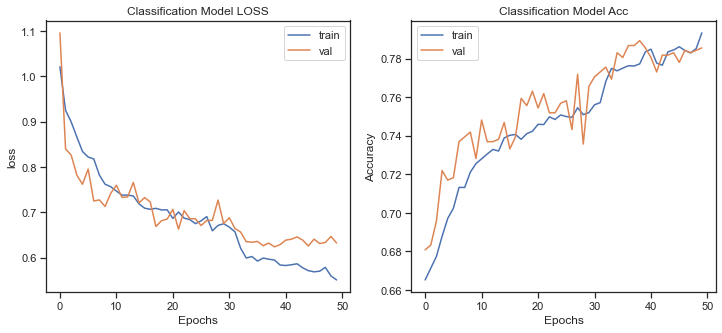

In [59]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("Classification Model LOSS");
plt.ylabel("loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['accuracy']);
plt.plot(h.history['val_accuracy']);
plt.title("Classification Model Acc");
plt.ylabel("Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [60]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
loss_v, accuracy_v = model.evaluate(x_validate, y_validate, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))

26/26 [==============================] - 2s 66ms/step - loss: 0.6326 - accuracy: 0.7855
Validation: accuracy = 0.785536  ;  loss_v = 0.632603
Test: accuracy = 0.759860  ;  loss = 0.637568


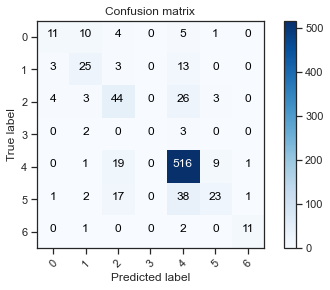

In [61]:
# Function to plot confusion matrix    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
Y_pred = model.predict(x_validate)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(y_validate,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)

 

# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(7)) 

Text(0, 0.5, 'Fraction classified incorrectly')

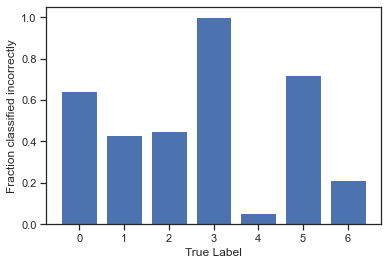

In [62]:
label_frac_error = 1 - np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)
plt.bar(np.arange(7),label_frac_error)
plt.xlabel('True Label')
plt.ylabel('Fraction classified incorrectly')

## Result

Both the plots for our model loss and model accuracy are good indications that are model is not overfitting. Both the traning and test data follow the same trend in them.

Looking at our incorrect predictions the model incorrectly predicted Basal cell carcinoma the most. This is not extremely reassuring since basal cell carcinoma is one of the few malignant lesions in this dataset.

On a positive note the model ran fairly efficiently and maintained a respectable validation accuracy of 79%. With further hyperparameter tuning we could surely increase this score.

## ResNet Model

ResNet is a fairly common CNN architecture, that has been used for computer vision tasks many times. ResNet makes use of shortcut connections to solve a problem that has plagued deep learning for a very long time...the vanishing gradient problem. In short the vanishing gradient problem can be described as follows: As more layers using certain activation functions are added to neural networks, the gradients of the loss function approaches zero, making the network hard to train. For shallow network with only a few layers that use these activations, this isn’t a big problem. However, when more layers are used, it can cause the gradient to be too small for training to work effectively.

Now comes the ResNet which is an expansive network that does not have this problem. It is a 34-layer plain network that is inspired by VGG-19 in which the shortcut connection or the skip connections are added. These skip connections or the residual blocks then convert the architecture into the residual network. It makes use of all the features described in the simpler CNN above.

Credit: https://www.analyticsvidhya.com/blog/2021/06/build-resnet-from-scratch-with-python/

https://towardsdatascience.com/the-vanishing-gradient-problem-69bf08b15484

In [30]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, Model, Input

width_shape = 75
height_shape = 100

image_input = Input(shape=(width_shape, height_shape, 3))
clf_model = ResNet50(input_tensor=image_input, include_top=False,weights='imagenet')

In [31]:
clf_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 75, 100, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 81, 106, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 38, 50, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 38, 50, 64)   256         ['conv1_conv[0][0]']      

In [72]:
for layer in clf_model.layers:
    layers.trainable = False

In [33]:
from tensorflow.keras import layers, optimizers
from tensorflow.keras.layers import *

In [34]:
#Adding layers at end
n_classes = 7
model = clf_model.output
model = MaxPool2D(pool_size = (2,2), padding = 'same')(model)
model = Flatten()(model)
model = Dense(128)(model)
model = Dropout(0.5)(model)
model = BatchNormalization()(model)
model = Activation('relu')(model)
model = Dropout(0.5)(model)
output = Dense(n_classes, activation='softmax')(model)
model = Model(inputs=clf_model.input, outputs=output)

In [35]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 75, 100, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 81, 106, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 38, 50, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 38, 50, 64)   256         ['conv1_conv[0][0]']         

In [83]:
earlystopping = EarlyStopping(monitor='val_loss', 
                              mode='min', 
                              verbose=1, 
                              patience=15
                             )
checkpointer = ModelCheckpoint(filepath="clf-resnet-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )
callbacks = [checkpointer, earlystopping, reduce_lr]

In [85]:
# Compile the model
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

In [86]:
epochs = 50 
batch_size = 10
z = model.fit(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_validate,y_validate),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size,
                              callbacks=[checkpointer, earlystopping, reduce_lr])

Epoch 1/50
721/721 [==============================] - ETA: 0s - loss: 1.3064 - accuracy: 0.6055
Epoch 00001: val_loss improved from inf to 1.11446, saving model to clf-resnet-weights.hdf5


C:\Users\will.pratt\Documents\temp\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


721/721 [==============================] - 371s 510ms/step - loss: 1.3064 - accuracy: 0.6055 - val_loss: 1.1145 - val_accuracy: 0.7007 - lr: 4.0000e-05
Epoch 2/50
721/721 [==============================] - ETA: 0s - loss: 0.9032 - accuracy: 0.7103
Epoch 00002: val_loss improved from 1.11446 to 0.73193, saving model to clf-resnet-weights.hdf5
721/721 [==============================] - 360s 500ms/step - loss: 0.9032 - accuracy: 0.7103 - val_loss: 0.7319 - val_accuracy: 0.7930 - lr: 4.0000e-05
Epoch 3/50
721/721 [==============================] - ETA: 0s - loss: 0.8008 - accuracy: 0.7451
Epoch 00003: val_loss improved from 0.73193 to 0.71495, saving model to clf-resnet-weights.hdf5
721/721 [==============================] - 354s 492ms/step - loss: 0.8008 - accuracy: 0.7451 - val_loss: 0.7149 - val_accuracy: 0.7943 - lr: 4.0000e-05
Epoch 4/50
721/721 [==============================] - ETA: 0s - loss: 0.7198 - accuracy: 0.7666
Epoch 00004: val_loss improved from 0.71495 to 0.65430, saving m

In [87]:
z.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

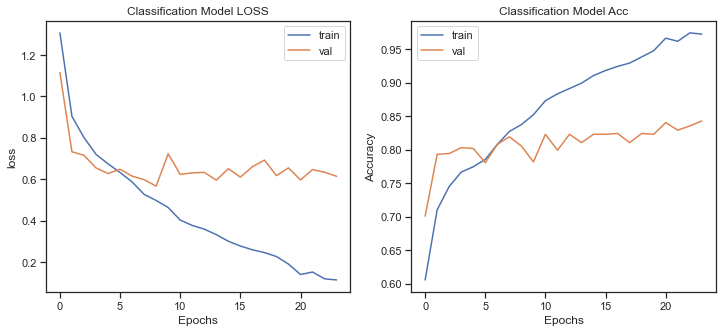

In [88]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(z.history['loss']);
plt.plot(z.history['val_loss']);
plt.title("Classification Model LOSS");
plt.ylabel("loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(z.history['accuracy']);
plt.plot(z.history['val_accuracy']);
plt.title("Classification Model Acc");
plt.ylabel("Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [89]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
loss_v, accuracy_v = model.evaluate(x_validate, y_validate, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))

26/26 [==============================] - 7s 257ms/step - loss: 0.6136 - accuracy: 0.8429
Validation: accuracy = 0.842893  ;  loss_v = 0.613602
Test: accuracy = 0.825761  ;  loss = 0.579119


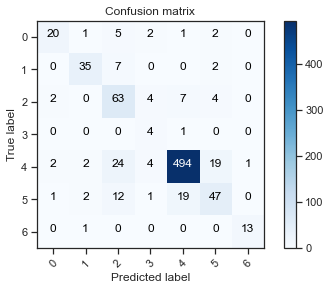

In [90]:
# Function to plot confusion matrix    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
Y_pred = model.predict(x_validate)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(y_validate,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)

 

# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(7)) 

Text(0, 0.5, 'Fraction classified incorrectly')

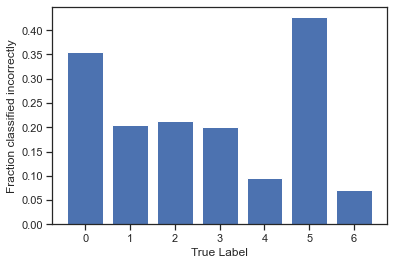

In [91]:
label_frac_error = 1 - np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)
plt.bar(np.arange(7),label_frac_error)
plt.xlabel('True Label')
plt.ylabel('Fraction classified incorrectly')

## Result

Based on our results we can see that the ResNet performed slightly better than our baseline CNN model. The validation accuracy was an impressive 84%.

Interestingly enough the models incorrect predictions did not exactly match the baseline CNNs incorrect predictions. Category 5 which was vascular lesions had the highest proportion of missed classifications.

We can see around epoch 5 that are model began to overfit as the training and validation sets began to diverge.

## Discussion/Conclusion

In this project we trained two deep neural networks intended for the task of skin-lesion classification. We used two different  architectures with slightly different hyperparameters. We achieved 84% overall accuracy on HAM10000 using the ResNet model. We used optional means of data preprocessing including data augmentation, which enables our models to not overfit and various metrics to compare our models performances. These metrics included overall accuracy, loss, confusion matrix, proportion of incorrect classifications and consumed time. Results reveal that the ResNet50 CNN architecture provides the most accurate skin lesion classification, although it did consume much more computational time than the baseline CNN. For future revisions, continued experimentation with hyperparameters including activation functions, dropout, number of dense layers, and possibly creating an ensemble model should be considered to elevate accuracy.

Additional sources:

https://www.kaggle.com/code/kmader/deep-learning-skin-lesion-classification

https://www.kaggle.com/code/jnegrini/ham10000-analysis-and-model-comparison

https://www.kaggle.com/code/kmader/dermatology-mnist-loading-and-processing